## Nicole Pagane | 18.337 Final Project | Spring 2022

In [1]:
include("./Gillespie.jl/src/Gillespie.jl")
using .Gillespie 
using Gadfly
using Random
using Distributions
using BenchmarkTools
using DifferentialEquations
using DataFrames

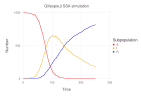

In [2]:
function F(x,parms)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [infection,recovery]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01]
tf = 250.0
Random.seed!(1234)

result = ssa(x0,F,nu,parms,tf)

data = ssa_data(result)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl SSA simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

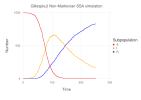

In [3]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [Exponential(1/infection),Exponential(1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01]
tf = 250.0
Random.seed!(1234)

result = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)

data = ssa_data(result)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl Non-Markovian SSA simulation"),
    Guide.manual_color_key("Subpopulation",["S","I","R"],["red","orange","blue"]),
    plot_theme
)

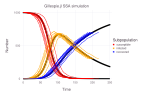

In [16]:
function F(x,parms)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [infection,recovery]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01]
tf = 250.0
Random.seed!(Int(round(rand()*1000)))

result = ssa(x0,F,nu,parms,tf)
data = ssa_data(result)[1:1700,:] 
for i in 1:11
    Random.seed!(Int(round(rand()*1000)))
    result = ssa(x0,F,nu,parms,tf)
    tempdata = ssa_data(result)
    while size(tempdata)[1] < 1700
        push!(tempdata,tempdata[end,:])
    end
    data = hcat(data,tempdata[1:1700,:], makeunique=true)
end

function sirode!(xdot,x,data,t)
    (S,I,R) = x
    (β,γ) = data
    xdot[1] = -β*S*I
    xdot[2] = β*S*I-γ*I
    xdot[3] = γ*I
end;

prob = ODEProblem(sirode!,x0,(0,250),parms)
sol = solve(prob)
times = 0:250/1699:250
simulation_ode =  zeros(1700,3)
for i in 1:length(times)
    temp = sol(times[i])
    simulation_ode[i,1] = temp[1]
    simulation_ode[i,2] = temp[2]
    simulation_ode[i,3] = temp[3]
end
simulation_ode = DataFrame(time=times,x1=simulation_ode[:,1],x2=simulation_ode[:,2],x3=simulation_ode[:,3])

data = hcat(data,simulation_ode, makeunique=true)

plot_theme = Theme(
        panel_fill=colorant"white",
        default_color=colorant"black"
    )
p = plot(data,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_1,y=:x1_1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_1,y=:x2_1,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_1,y=:x3_1,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_2,y=:x1_2,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_2,y=:x2_2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_2,y=:x3_2,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_3,y=:x1_3,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_3,y=:x2_3,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_3,y=:x3_3,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_4,y=:x1_4,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_4,y=:x2_4,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_4,y=:x3_4,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_5,y=:x1_5,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_5,y=:x2_5,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_5,y=:x3_5,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_6,y=:x1_6,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_6,y=:x2_6,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_6,y=:x3_6,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_7,y=:x1_7,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_7,y=:x2_7,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_7,y=:x3_7,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_8,y=:x1_8,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_8,y=:x2_8,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_8,y=:x3_8,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_9,y=:x1_9,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_9,y=:x2_9,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_9,y=:x3_9,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_10,y=:x1_10,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_10,y=:x2_10,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_10,y=:x3_10,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_11,y=:x1_11,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_11,y=:x2_11,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_11,y=:x3_11,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_12,y=:x1_12,Geom.step,Theme(line_width = 3pt, default_color=colorant"black")),
    layer(x=:time_12,y=:x2_12,Geom.step,Theme(line_width = 3pt, default_color=colorant"black")),
    layer(x=:time_12,y=:x3_12,Geom.step,Theme(line_width = 3pt, default_color=colorant"black")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl SSA simulation"),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)


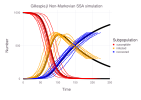

In [14]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [Exponential(1/infection),Exponential(1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01]
tf = 250.0
Random.seed!(Int(round(rand()*1000)))

result = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)
data = ssa_data(result)[1:1700,:] 
for i in 1:11
    Random.seed!(Int(round(rand()*1000)))
    result = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)
    tempdata = ssa_data(result)
    while size(tempdata)[1] < 1700
        push!(tempdata,tempdata[end,:])
    end
    data = hcat(data,tempdata[1:1700,:], makeunique=true)
end

function sirode!(xdot,x,data,t)
    (S,I,R) = x
    (β,γ) = data
    xdot[1] = -β*S*I
    xdot[2] = β*S*I-γ*I
    xdot[3] = γ*I
end

prob = ODEProblem(sirode!,x0,(0,250),parms)
sol = solve(prob)
simulation_ode =  zeros(1700,3)
for i in 1:length(times)
    temp = sol(times[i])
    simulation_ode[i,1] = temp[1]
    simulation_ode[i,2] = temp[2]
    simulation_ode[i,3] = temp[3]
end
simulation_ode = DataFrame(time=times,x1=simulation_ode[:,1],x2=simulation_ode[:,2],x3=simulation_ode[:,3])

data = hcat(data,simulation_ode, makeunique=true)

plot_theme = Theme(
        panel_fill=colorant"white",
        default_color=colorant"black"
    )
p = plot(data,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_1,y=:x1_1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_1,y=:x2_1,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_1,y=:x3_1,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_2,y=:x1_2,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_2,y=:x2_2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_2,y=:x3_2,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_3,y=:x1_3,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_3,y=:x2_3,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_3,y=:x3_3,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_4,y=:x1_4,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_4,y=:x2_4,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_4,y=:x3_4,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_5,y=:x1_5,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_5,y=:x2_5,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_5,y=:x3_5,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_6,y=:x1_6,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_6,y=:x2_6,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_6,y=:x3_6,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_7,y=:x1_7,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_7,y=:x2_7,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_7,y=:x3_7,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_8,y=:x1_8,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_8,y=:x2_8,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_8,y=:x3_8,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_9,y=:x1_9,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_9,y=:x2_9,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_9,y=:x3_9,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_10,y=:x1_10,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_10,y=:x2_10,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_10,y=:x3_10,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_11,y=:x1_11,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time_11,y=:x2_11,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time_11,y=:x3_11,Geom.step,Theme(default_color=colorant"blue")),
    layer(x=:time_12,y=:x1_12,Geom.step,Theme(line_width = 3pt, default_color=colorant"black")),
    layer(x=:time_12,y=:x2_12,Geom.step,Theme(line_width = 3pt, default_color=colorant"black")),
    layer(x=:time_12,y=:x3_12,Geom.step,Theme(line_width = 3pt, default_color=colorant"black")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl Non-Markovian SSA simulation"),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)


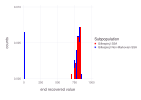

In [5]:
nruns = 100
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [Exponential(1/infection),Exponential(1/recovery)]
end
x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01]
tf = 250.0
og = [ssa(x0,F,nu,parms,tf).data[end,end] for i in 1:nruns]
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [Exponential(1/infection),Exponential(1/recovery)]
end
new = [ssa(x0,F,nu,parms,tf,algo=:nonmarkov).data[end,end] for i in 1:nruns]


plot(
    layer(x=og,Geom.histogram(density=true),Theme(default_color=colorant"red")),
    layer(x=new,Geom.histogram(density=true),Theme(default_color=colorant"blue")),
    Guide.manual_color_key("Subpopulation",["Gillespie.jl SSA ","Gillespie.jl Non-Markovian SSA "],["red","blue"]),
    Guide.xlabel("end recovered value"),
    Guide.ylabel("counts"),
    plot_theme
)

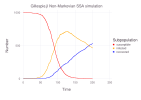

In [6]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma,alpha) = parms
  infection = beta*S*I
  recovery = gamma*I
  return [Exponential(1/infection),Weibull(alpha, 1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01, 0.75]
tf = 200.0
Random.seed!(1234)

result0 = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)

data0 = ssa_data(result0)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data0,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl Non-Markovian SSA simulation"),
    Scale.y_continuous(minvalue=0, maxvalue=1000),
    Scale.x_continuous(minvalue=0, maxvalue=150),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)

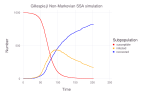

In [7]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma,alpha) = parms
  infection = beta*S*I
  recovery = gamma*I
  return [Weibull(alpha, 1/infection),Exponential(1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01, 3.0]
tf = 200.0
Random.seed!(1234)

result0 = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)

data0 = ssa_data(result0)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data0,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl Non-Markovian SSA simulation"),
    Scale.y_continuous(minvalue=0, maxvalue=1000),
    Scale.x_continuous(minvalue=0, maxvalue=150),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)

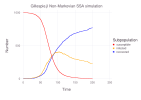

In [8]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma,alpha,zeta) = parms
  infection = beta*S*I
  recovery = gamma*I
  return [Weibull(alpha, 1/infection),Weibull(zeta, 1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0,0.01, 3.0, 0.75]
tf = 200.0
Random.seed!(1234)

result0 = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)

data0 = ssa_data(result0)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data0,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl Non-Markovian SSA simulation"),
    Scale.y_continuous(minvalue=0, maxvalue=1000),
    Scale.x_continuous(minvalue=0, maxvalue=150),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)

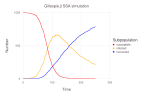

In [9]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [Exponential(1/infection),Exponential(1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0/1.1,0.01/1.1]
tf = 250.0
Random.seed!(1234)

result0 = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)

data0 = ssa_data(result0)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data0,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl SSA simulation"),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)

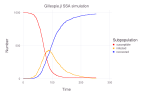

In [10]:
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [Exponential(1/infection),Exponential(1/recovery)]
end

x0 = [999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/1000.0/0.75,3*0.01]
tf = 250.0
Random.seed!(1234)

result0 = ssa(x0,F,nu,parms,tf,algo=:nonmarkov)

data0 = ssa_data(result0)

plot_theme = Theme(
    panel_fill=colorant"white",
    default_color=colorant"black"
)
p=plot(data0,
    layer(x=:time,y=:x1,Geom.step,Theme(default_color=colorant"red")),
    layer(x=:time,y=:x2,Geom.step,Theme(default_color=colorant"orange")),
    layer(x=:time,y=:x3,Geom.step,Theme(default_color=colorant"blue")),
    Guide.xlabel("Time"),
    Guide.ylabel("Number"),
    Guide.title("Gillespie.jl SSA simulation"),
    Guide.manual_color_key("Subpopulation",["susceptible","infected","recovered"],["red","orange","blue"]),
    plot_theme
)

In [11]:
function F(x,parms)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  [infection,recovery]
end

x0 = [9999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/10000.0,0.05]
tf = 400.0
Random.seed!(1235)

@benchmark ssa(x0,F,nu,parms,tf) samples=1000 seconds=100

BenchmarkTools.Trial: 1000 samples with 10 evaluations.
 Range (min … max):  826.200 ns …   2.599 ms  ┊ GC (min … max):  0.00% … 34.32%
 Time  (median):     891.213 μs               ┊ GC (median):     0.00%
 Time  (mean ± σ):   989.273 μs ± 433.403 μs  ┊ GC (mean ± σ):  10.75% ± 15.63%

               ▅▁  ▆▄▄  █▃▁ ▂▄▂                                  
  ▂▁▁▁▃▁▂▁▄▅▃▁▃██▅▂███▇▆███▅███▇▇▆▇▅▄▄▄▅▃▃▃▃▃▃▁▃▃▄▄▃▃▃▄▃▃▃▃▃▃▂▂ ▄
  826 ns           Histogram: frequency by time          2.3 ms <

 Memory estimate: 1.20 KiB, allocs estimate: 16.

In [15]:
x0 = [9999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/10000.0,0.05]
tf = 400.0
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  return [Exponential(1/infection),Exponential(1/recovery)]
end
Random.seed!(1235)

@benchmark ssa(x0,F,nu,parms,tf,algo=:nonmarkov) samples=1000 seconds=100

BenchmarkTools.Trial: 43 samples with 1 evaluation.
 Range (min … max):  448.282 μs … 6.927 s  ┊ GC (min … max): 0.00% … 0.32%
 Time  (median):     656.416 μs            ┊ GC (median):    0.00%
 Time  (mean ± σ):      2.451 s ± 3.223 s  ┊ GC (mean ± σ):  0.34% ± 0.16%

  █                                                           
  █▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▄▄▃▄▄ ▁
  448 μs         Histogram: frequency by time         6.93 s <

 Memory estimate: 65.88 KiB, allocs estimate: 33.

## just approximate sampling instead of exact

In [1]:
include("./Gillespie.jl/src/Gillespie.jl")
using .Gillespie 
using Random
using Distributions
using BenchmarkTools

x0 = [9999,1,0]
nu = [[-1 1 0];[0 -1 1]]
parms = [0.1/10000.0,0.05]
tf = 400.0
function F(x,parms,t,tk)
  (S,I,R) = x
  (beta,gamma) = parms
  infection = beta*S*I
  recovery = gamma*I
  return [Exponential(1/infection),Exponential(1/recovery)]
end
Random.seed!(1235)

@benchmark ssa(x0,F,nu,parms,tf,algo=:nonmarkov) samples=1000 seconds=100

BenchmarkTools.Trial: 1000 samples with 1 evaluation.
 Range (min … max):  521.792 μs …   4.858 ms  ┊ GC (min … max): 0.00% … 86.42%
 Time  (median):     592.341 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   607.240 μs ± 198.275 μs  ┊ GC (mean ± σ):  1.37% ±  3.86%

    ▇▅ ▅  ▄▆█▇▆▃▃▃▂▂    ▁                                        
  ▄▅████▇█████████████▇▇█▄▄▆▆█▅▅▅▇██▅▄▅▅▁▆▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▄▄▄▅ █
  522 μs        Histogram: log(frequency) by time        928 μs <

 Memory estimate: 65.88 KiB, allocs estimate: 33.